In [ ]:
import tensorflow as tf
from tensorflow import keras
import os
from tensorflow.keras.layers import Dense,Conv2D,BatchNormalization,Input,Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
!rm -r DIV2K_train_HR.zip

In [ ]:
!wget http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
!rm -r drive/MyDrive/div2k/
!mkdir drive/MyDrive/div2k
!unzip -q DIV2K_train_HR.zip -d drive/MyDrive/div2k/


--2021-10-14 08:24:58--  http://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
Resolving data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)... 129.132.52.178, 2001:67c:10ec:36c2::178
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip [following]
--2021-10-14 08:24:59--  https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip
Connecting to data.vision.ee.ethz.ch (data.vision.ee.ethz.ch)|129.132.52.178|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3530603713 (3.3G) [application/zip]
Saving to: ‘DIV2K_train_HR.zip’

DIV2K_train_HR.zip  100%[===================>]   3.29G  25.3MB/s    in 2m 16s  

2021-10-14 08:27:15 (24.7 MB/s) - ‘DIV2K_train_HR.zip’ saved [3530603713/3530603713]

rm: cannot remove 'drive/MyDrive/div2k/': No such file or directory


In [ ]:
from google.colab import drive
drive.mount('drive')

Mounted at /content/drive


In [ ]:
path="drive/MyDrive/div2k/DIV2K_train_HR"
image_filename=[]
for root,dirname,filenames in os.walk(path):
  for filename in filenames:
    image_filename.append(os.path.join(root,filename))
print(len(image_filename))

800


In [ ]:
#preprocessing the dataset
def loadtrainandtest(image):
  # print(image.shape)
  y=image.shape[0]//2
  x=image.shape[1]//2
  # finding the center of the images from cropping
  image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
  image=image[y-300:y+300,x-300:x+300]
  # 
  highresimage=cv2.resize(image,(300,300),cv2.INTER_AREA)
  highresimage=highresimage/255
  noise=np.random.randn(300,300)
  lowresimage=highresimage[:,:]+noise/30

  return highresimage,lowresimage


x,y=[],[]
for i in range(len(image_filename)):
  print(f'{i} > {image_filename[i]} loaded')
  images=loadtrainandtest(cv2.imread(image_filename[i]))
  # y is the target high res image
  print(f'{i} > {image_filename[i]} written in memory')
  y.append(images[0])
  x.append(images[1])

for i in range(len(image_filename)):
  print(f'{i} > {image_filename[i]} written in memory')
  cv2.imwrite(os.path.join("drive/MyDrive/div2k_preprocessed/x_train",image_filename[i]),x[i])
  cv2.imwrite(os.path.join("drive/MyDrive/div2k_preprocessed/y_train",image_filename[i]),y[i])

# preprocessing engine for reading in the images


0 > drive/MyDrive/div2k/DIV2K_train_HR/0103.png loaded
0 > drive/MyDrive/div2k/DIV2K_train_HR/0103.png written in memory
1 > drive/MyDrive/div2k/DIV2K_train_HR/0413.png loaded
1 > drive/MyDrive/div2k/DIV2K_train_HR/0413.png written in memory
2 > drive/MyDrive/div2k/DIV2K_train_HR/0031.png loaded
2 > drive/MyDrive/div2k/DIV2K_train_HR/0031.png written in memory
3 > drive/MyDrive/div2k/DIV2K_train_HR/0660.png loaded
3 > drive/MyDrive/div2k/DIV2K_train_HR/0660.png written in memory
4 > drive/MyDrive/div2k/DIV2K_train_HR/0126.png loaded
4 > drive/MyDrive/div2k/DIV2K_train_HR/0126.png written in memory
5 > drive/MyDrive/div2k/DIV2K_train_HR/0793.png loaded
5 > drive/MyDrive/div2k/DIV2K_train_HR/0793.png written in memory
6 > drive/MyDrive/div2k/DIV2K_train_HR/0764.png loaded
6 > drive/MyDrive/div2k/DIV2K_train_HR/0764.png written in memory
7 > drive/MyDrive/div2k/DIV2K_train_HR/0550.png loaded
7 > drive/MyDrive/div2k/DIV2K_train_HR/0550.png written in memory
8 > drive/MyDrive/div2k/DIV2K_tr

### Idea of the model architecutre taken from the paper 
[Residual Dense Network for Image Super-Resolution](https://arxiv.org/abs/1802.08797)

In [ ]:
def residual_block(filters,input_layer):
    # input_layer=Input(shape=input_shape)
    layers=[input_layer,]
    for i in range(1,10):
        if i==1:
            layers.append(Conv2D(filters,(3,3),activation="relu",padding="same",name=f"{i}")(layers[i-1]))
        elif i==2:
            layers.append(Conv2D(filters,(3,3),activation="relu",padding="same",name=f"{i}")(Concatenate()([layers[i-1],layers[i-2]])))
        else:
            layers.append(Conv2D(filters, (3, 3), activation="relu", padding="same", name=f"{i}")(Concatenate()(layers[1:])))

    layers.append(Conv2D(10,(3,3),activation="relu",padding="same",name="last_layer")(Concatenate()(layers[1:])))
    layers.append(Conv2D(5,(3,3),activation="relu",padding="same")(layers[-1]))
    layers.append(Conv2D(1,(3,3),activation="relu",padding="same")(layers[-1]))
    return Model(input_layer,layers[-1])

In [ ]:
input_layer=tf.keras.layers.Input(shape=(*x[0].shape,1))
model=residual_block(12,input_layer)

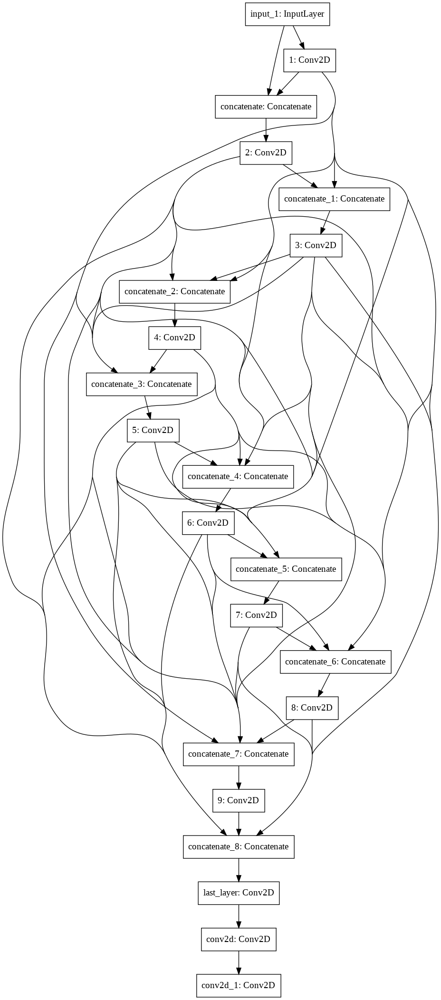

In [ ]:
plot_model(model)

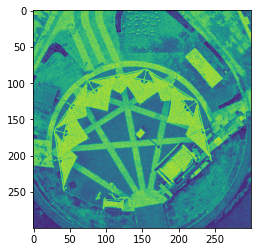

In [ ]:
plt.imshow(x[0].reshape(300,300))

In [ ]:
# training loop (loads in a set of image and trains the model on that image)
x=np.array(x)
y=np.array(y)
  



In [ ]:
x=x.reshape((-1,300,300,1))
y=y.reshape((-1,300,300,1))

In [ ]:
x[0].shape

(300, 300, 1)

In [ ]:
x[:600].shape

(600, 300, 300, 1)

In [ ]:
model.compile(loss="mse",optimizer="adam",metrics=["accuracy"])

In [ ]:
model.fit(x[:600],y[:600],epochs=30)

Epoch 1/30
 1/19 [>.............................] - ETA: 14:15 - loss: 0.2642 - accuracy: 3.2951e-04

ResourceExhaustedError: ignored

In [ ]:
!mkdir /content/drive/MyDrive/models

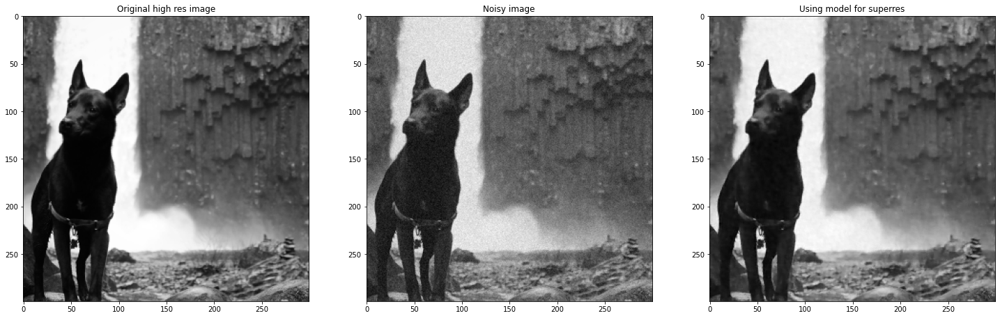

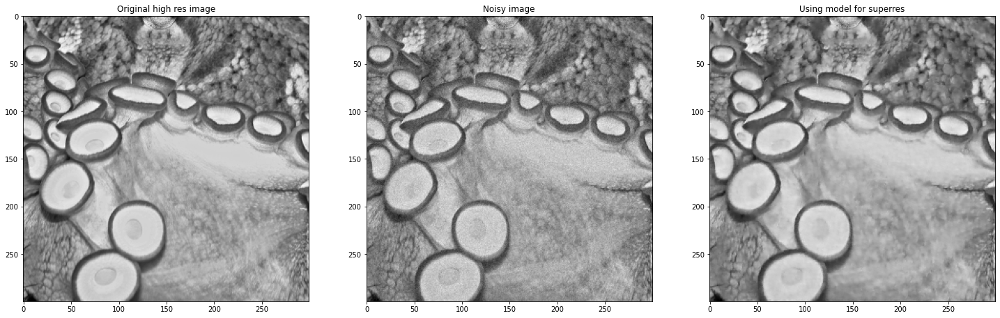

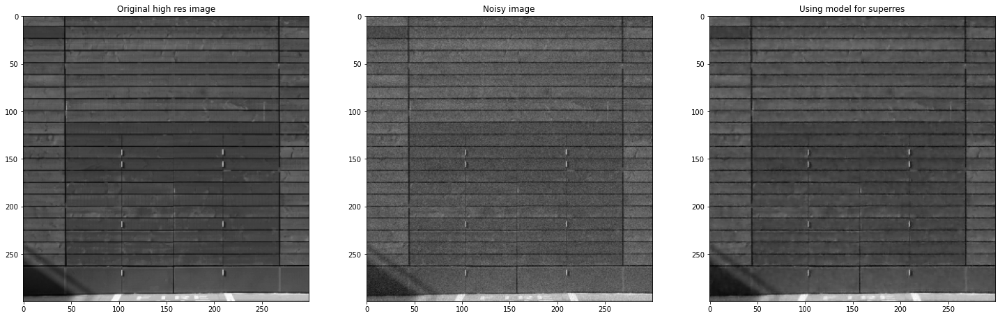

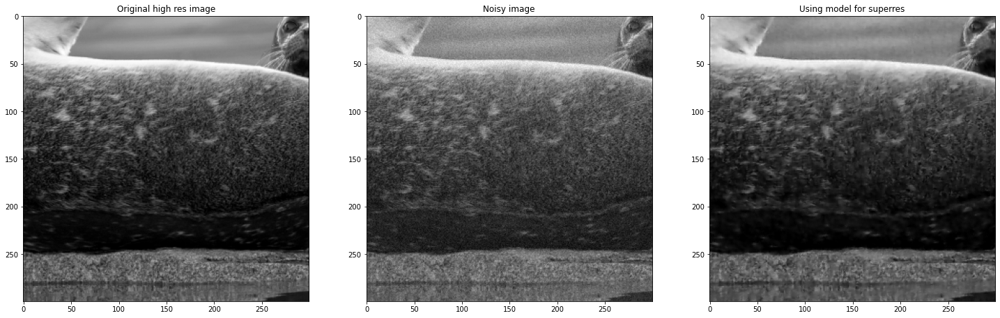

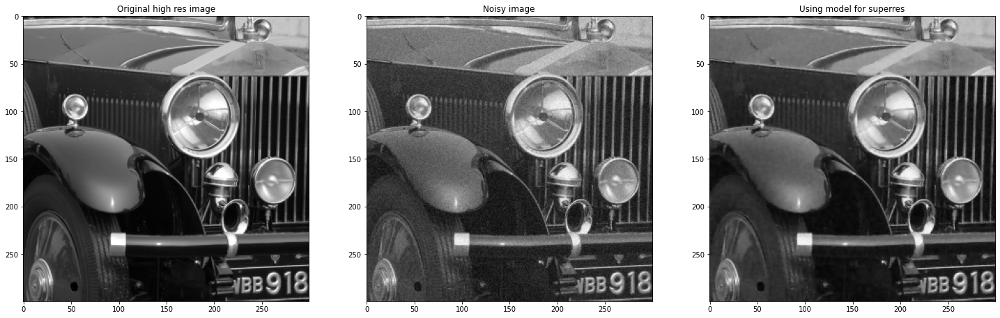

...

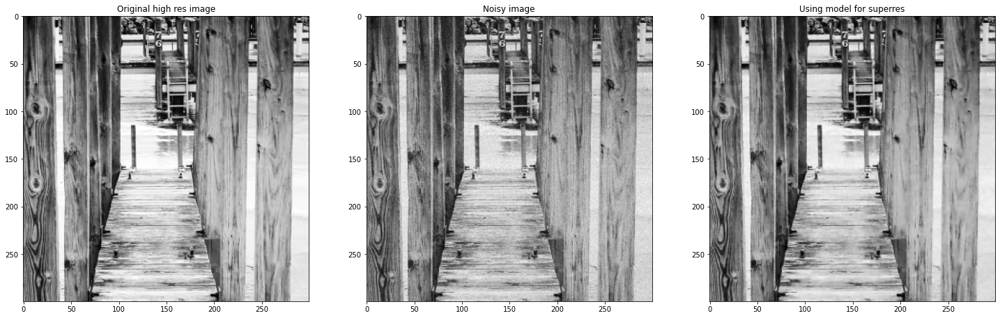

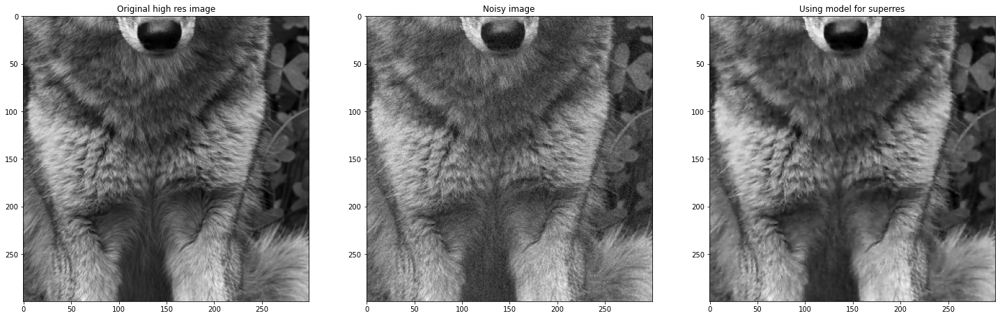

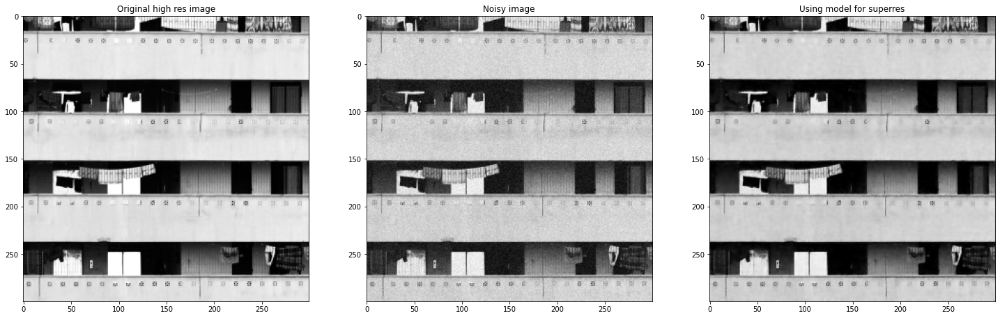

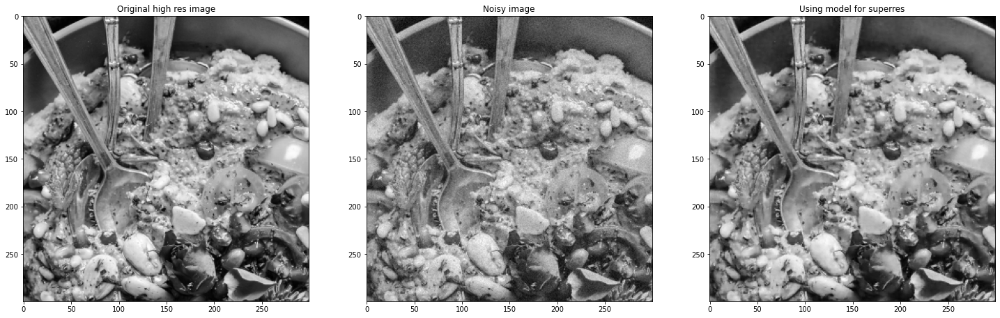

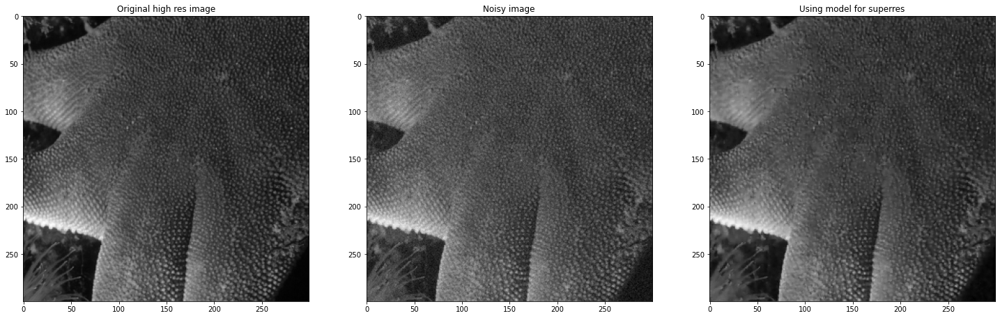

In [ ]:
def plot_images(orignal_image,noisy_image,model):
  f, (ax1,ax2,ax3) = plt.subplots(1,3)
  f.set_figheight(25)
  f.set_figwidth(25)
  ax1.imshow(orignal_image.reshape(300,300),cmap="gray")
  ax1.set_title("Original high res image")
  
  ax2.imshow(noisy_image.reshape(300,300),cmap="gray")
  ax2.set_title("Noisy image")

  data=model.predict(noisy_image.reshape(1,300,300,1))
  ax3.imshow(data.reshape(300,300),cmap="gray")
  ax3.set_title("Using model for superres")

for i in range(620,640,1):
  plot_images(y[i],x[i],newmodel)
  plt.show()

In [ ]:
# model.save(os.path.join("/content/drive/MyDrive/models","newmodel.h5"))
model.save(os.path.join("/content/drive/MyDrive/models","newmodel_version2.h5"))


In [ ]:
newmodel=tf.keras.models.load_model(os.path.join("/content/drive/MyDrive/models","newmodel_version2.h5"))

In [ ]:
newmodel.evaluate(x[601:],y[601:])

7/7 [==============================] - 39s 422ms/step - loss: 5.6904e-04 - accuracy: 0.0041


[0.0005690382677130401, 0.004073422867804766]

In [ ]:
newmodel.summary()

NameError: ignored